In [1]:
# Import basic packages
import numpy as np
import pandas as pd
# Import data processing package
from DataProcessing import *
# Import plot packages
import gspplot
from gspplot import *
import matplotlib.pyplot as plt
# Import graph package
import gsp
import networkx as nx
# Import other package
from Learning import *
from operator import itemgetter
import warnings; warnings.filterwarnings('ignore')

# 1 Point Cloud Visualization

In [2]:
path_cloud = 'data/Vaihingen3D_Traininig.pts'
# Load dataset as pandas dataframe
cloud      = load_cloud(path_cloud)
newcloud   = cloud_preprocess(cloud)
# Crop a patch from cloud
patch2     = crop_patch(newcloud, (320, 350), (100, 140))
patch2.reset_index(drop=True, inplace=True)

-------------------- Load Data ---------------------
Data Loading...
=> Done.
----------------------------------------------------
--------------- Data Pre-Processing ----------------
Drop duplicates...
=> Duplicates #: 40946, Ratio: 5.43% of the dataset.
Re-center the data...
=> Done.
----------------------------------------------------
-------------------- Crop Patch --------------------
Crop the patch...
=> Crop a patch from: x:[320, 350], y:[100, 140].
=> Points left for patch: 16943.
----------------------------------------------------


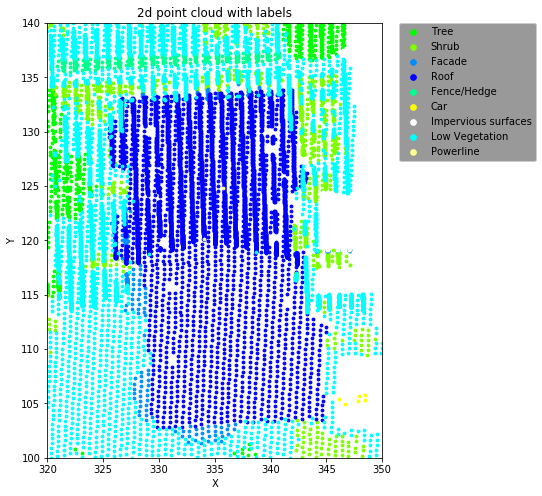

In [3]:
plot_graph_2D(patch2, 
              figsize=(6, 8), 
              marksize=8, 
              markerscale=2,
              blackBack=False,
              xRange=(320, 350), 
              yRange=(100, 140))

# 2 Graph Construction

## 2.1 Adjacency Matrix Construction

In [4]:
# Construct weight matrix 
# 30nn, Gaussian kernel
W_30nn_Gaussain, _ = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], k=30, dist3D=False, 
                               mode='distance', neightype='number')
# 30nn, Binary 
W_30nn_Binary, _   = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], k=30, dist3D=False,
                               mode='connectivity', neightype='number')
# 30nn, Local 
W_30nn_Local, _    = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], k=30, dist3D=False, 
                               mode='local', neightype='number')
# 10nn, Gassian kernel
W_r101_Gaussain, _ = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], r=1.1, dist3D=False, 
                               mode='distance', neightype='radius')
#30nn, Binary graph
W_r101_Binary, _   = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], r=1.1, dist3D=False, 
                               mode='connectivity', neightype='radius')

adjacency_list = [W_30nn_Gaussain, W_30nn_Binary, W_30nn_Local, 
                  W_r101_Gaussain, W_r101_Binary]

## 2.2 Graph Construction

In [5]:
graph_dict = dict.fromkeys(['G_30nn_Gaussain', 'G_30nn_Binary', 'G_30nn_Local',
                            'G_r101_Gaussain', 'G_r101_Binary'])
for i, j in zip(graph_dict.keys(), adjacency_list):
    graph_dict[i] = nx.from_scipy_sparse_matrix(j)

# 3 Graph Visualization

In this part, we visualize the area that has unequal point density distribution.

In [6]:
# Set the postions and colors of nodes
pos_values = [(i, j) for i, j in zip(patch2.y, patch2.x)]
pos = dict(zip(range(W_30nn_Gaussain.shape[0]), pos_values))
nodecolor = list(patch2['label'] == 5)
nodecolor = ['r' if i else 'b' for i in nodecolor]

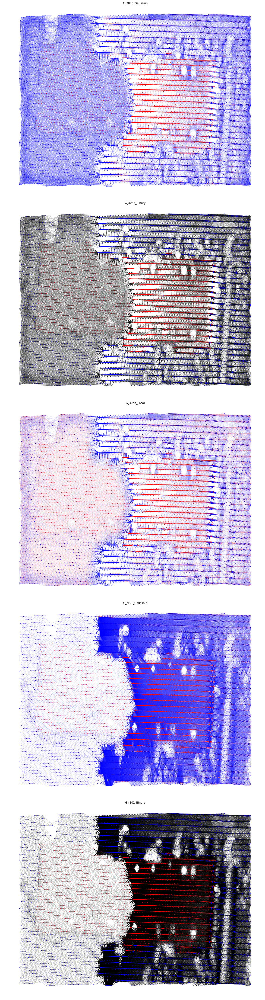

In [7]:
# Visualize the graphs
title_list = list(graph_dict.keys())
fig, axes  = plt.subplots(5, 1, figsize=(16, 60))
for i, j in zip(graph_dict.keys(), range(5)):               
    edges,weights = zip(*nx.get_edge_attributes(graph_dict[i], 'weight').items())
    if 'Binary' in i:
        nx.draw(graph_dict[i], 
                pos, 
                node_size=1, 
                node_color=nodecolor, 
                ax=axes[j],
                width=0.2)
    else:
        nx.draw(graph_dict[i], 
                pos, 
                node_size=1, 
                node_color=nodecolor, 
                ax=axes[j],
                width=0.2, 
                edgelist=edges, 
                edge_color=weights, 
                edge_cmap=plt.cm.bwr)
    axes[j].set_title(title_list[j])
plt.tight_layout()